In [2]:
from time import time
import matplotlib.pyplot as plt
import numpy as np
import scipy as sp
import scanpy as sc
from bbknn import bbknn
import scanorama as scnrma
import pandas as pd
import seaborn as sns

from matplotlib.colors import ListedColormap

import warnings

warnings.filterwarnings('ignore')

sc.settings.verbosity = 0             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.set_figure_params(dpi=100, dpi_save=200)

scanpy==1.6.0 anndata==0.7.4 umap==0.3.10 numpy==1.17.2 scipy==1.5.2 pandas==1.1.0 scikit-learn==0.21.3 statsmodels==0.10.1 python-igraph==0.7.1 louvain==0.6.1 leidenalg==0.7.0


# DR non-neurons

Read in P28+P38 DR object that has doublet info but has undergone no filtering. Actually, it was subset to Sarah's cells in `DoubletDetection_unfiltered.ipynb`

In [272]:
adata_dr = sc.read_h5ad('Pooled_DR_dubs_unfiltered.h5ad')
adata_dr

AnnData object with n_obs × n_vars = 14691 × 53801
    obs: 'percent_mito', 'n_counts', 'Doublet', 'Doublet Score', 'batch', 'sample'
    var: 'gene_ids', 'feature_types'

In [273]:
print(adata_dr[adata_dr.obs.Doublet,:].shape[0], 'doublets')
adata_dr = adata_dr[adata_dr.obs.Doublet==False,:]
adata_dr

141 doublets


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


View of AnnData object with n_obs × n_vars = 14550 × 53801
    obs: 'percent_mito', 'n_counts', 'Doublet', 'Doublet Score', 'batch', 'sample'
    var: 'gene_ids', 'feature_types'

## Collective analysis

Analysis with both P28 and P38 to remove problematics.

In [274]:
sc.pp.filter_genes(adata_dr, min_cells=8)
sc.pp.filter_cells(adata_dr, min_genes=0) #just want n_genes to be computed

filtered out 32252 genes that are detected in less than 8 cells


Trying to set attribute `.var` of view, copying.


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


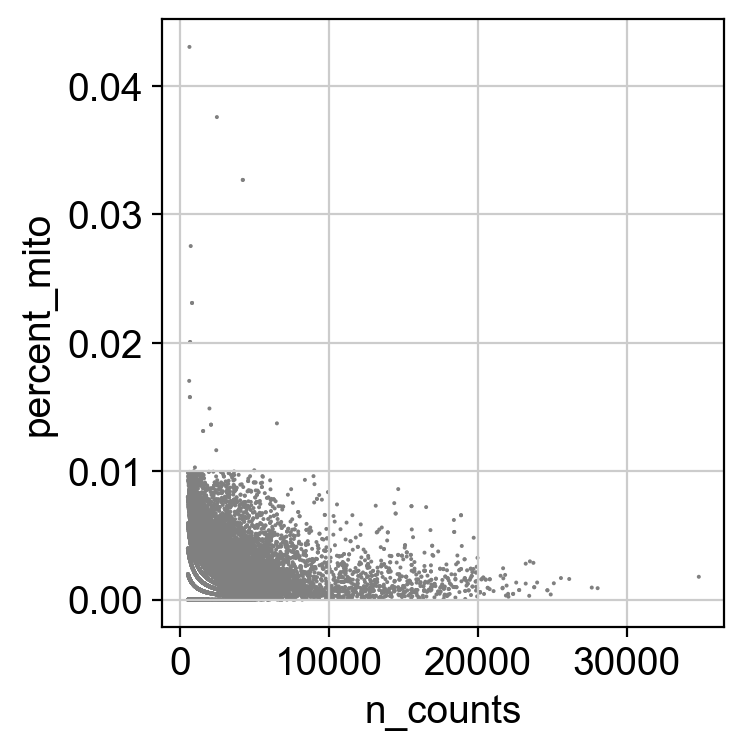

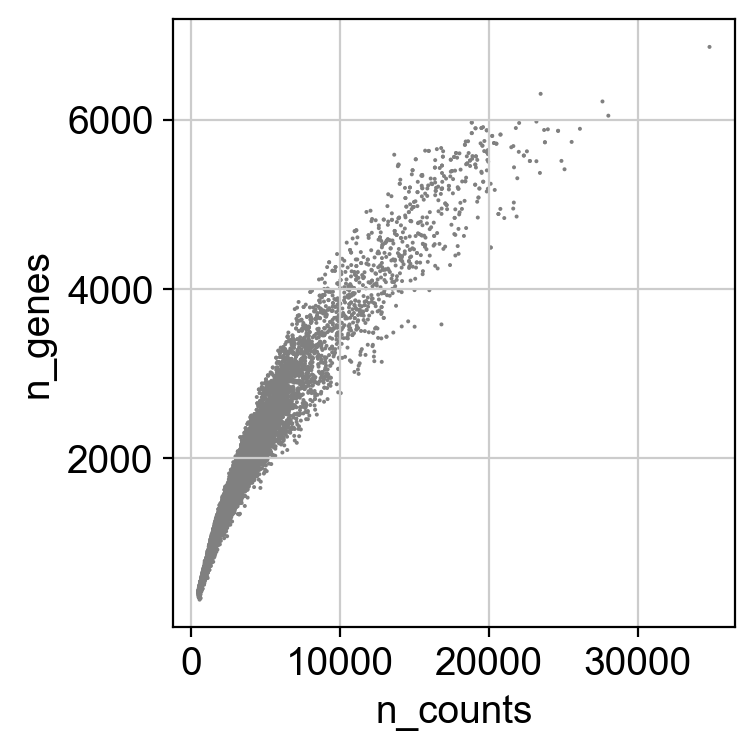

In [275]:
sc.pl.scatter(adata_dr, x='n_counts', y='percent_mito')
sc.pl.scatter(adata_dr, x='n_counts', y='n_genes')

In [276]:
adata_dr = adata_dr[adata_dr.obs['n_counts'] < 18000, :]

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


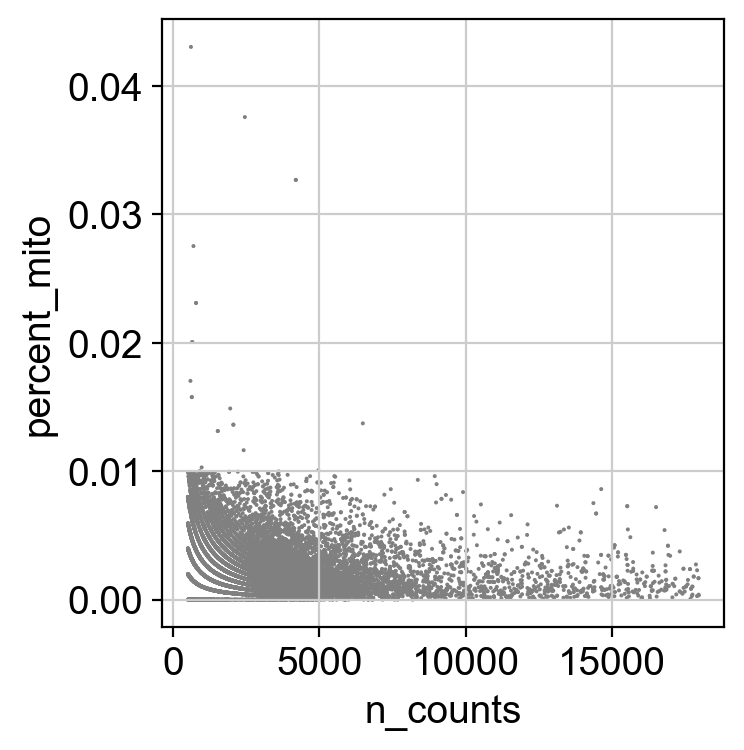

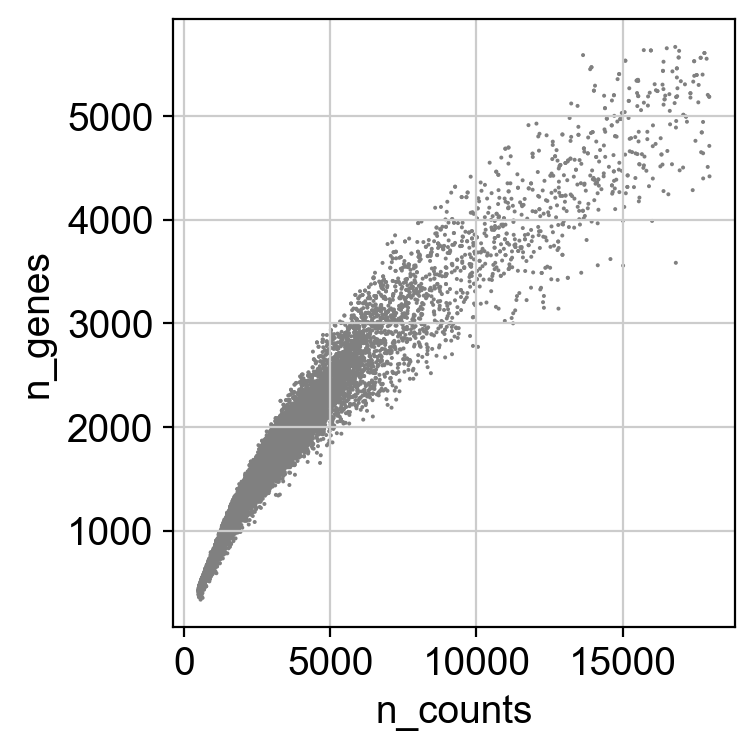

In [277]:
sc.pl.scatter(adata_dr, x='n_counts', y='percent_mito')
sc.pl.scatter(adata_dr, x='n_counts', y='n_genes')

In [278]:
sc.pp.normalize_per_cell(adata_dr, counts_per_cell_after=1e4)
sc.pp.log1p(adata_dr)

normalizing by total count per cell


Trying to set attribute `.obs` of view, copying.


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


In [279]:
adata_dr.raw = adata_dr #store pre-scale counts

In [280]:
adata_dr

AnnData object with n_obs × n_vars = 14432 × 21549
    obs: 'percent_mito', 'n_counts', 'Doublet', 'Doublet Score', 'batch', 'sample', 'n_genes'
    var: 'gene_ids', 'feature_types', 'n_cells'
    uns: 'log1p'

In [288]:
adata_dr.X = adata_dr.raw.X.A #for re-running after removing clusters
sc.pp.highly_variable_genes(adata_dr, min_mean=0.0125, max_mean=3, min_disp=0.5) #HVGs

sc.pp.scale(adata_dr, max_value=10) #scale
sc.tl.pca(adata_dr, svd_solver='arpack') #run PCA

sc.pp.neighbors(adata_dr, n_neighbors=25)
#bbknn(i, batch_key='sample',neighbors_within_batch =6 ) #doesn't work
sc.tl.leiden(adata_dr)
sc.tl.umap(adata_dr)

extracting highly variable genes
    finished (0:00:04)


Trying to set attribute `.uns` of view, copying.


--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:07)
computing neighbors
    using 'X_pca' with n_pcs = 50


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/numba/compiler.py:602: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../../../opt/anaconda3/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:08)
running Leiden clustering
    finished: found 19 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:08)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:12)


adata_dr = adata_dr[adata_dr.obs.leiden!='4',:]
adata_dr = adata_dr[adata_dr.obs.leiden!='9',:]
adata_dr = adata_dr[adata_dr.obs.leiden!='21',:]
adata_dr = adata_dr[adata_dr.obs.leiden!='18',:]
adata_dr = adata_dr[adata_dr.obs.leiden!='20',:]

adata_dr = adata_dr[adata_dr.obs.leiden!='17',:]
adata_dr = adata_dr[adata_dr.obs.leiden!='19',:]

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


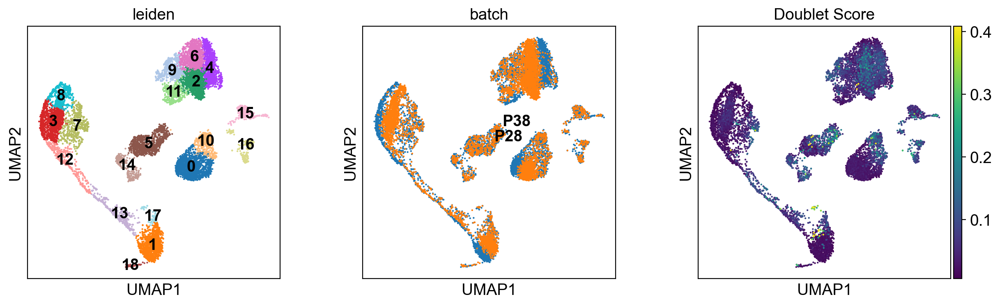

In [289]:
sc.pl.umap(adata_dr, color=['leiden', 'batch', 'Doublet Score'], legend_loc='on data')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns["dendrogram_['leiden']"]`


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


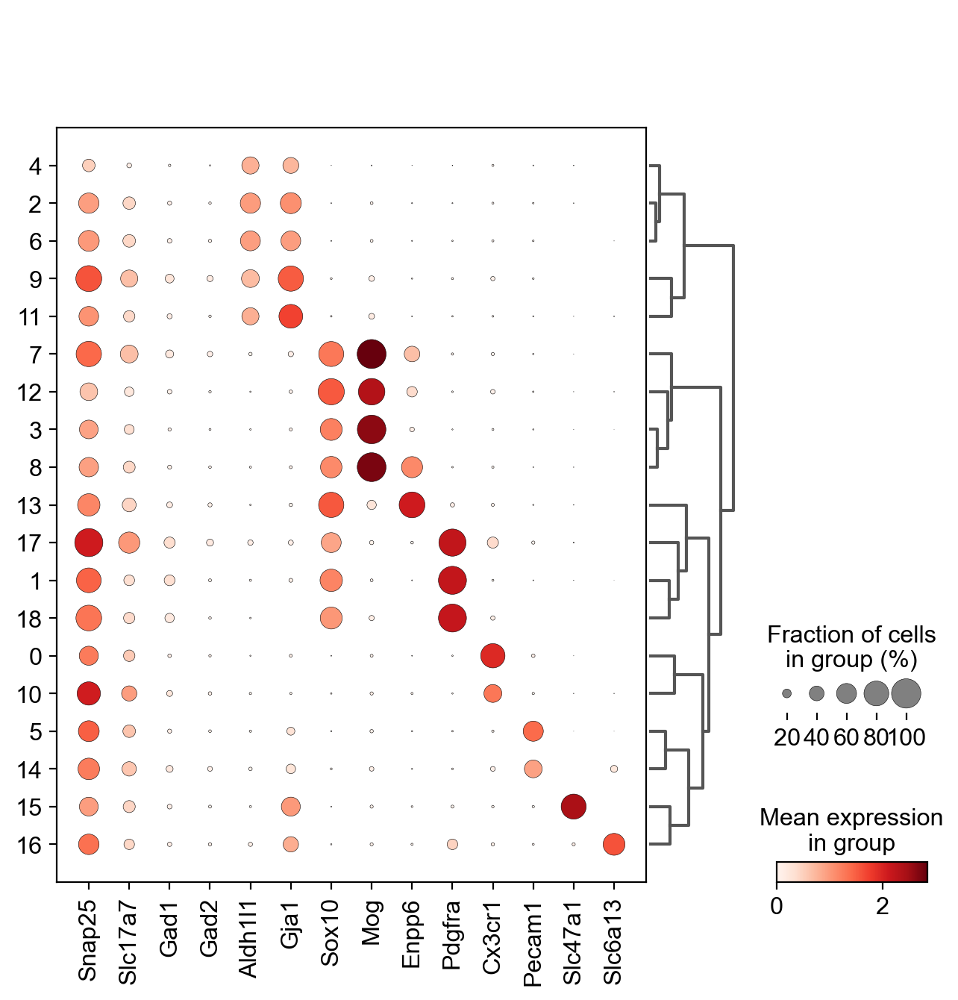

In [291]:
markers = ['Snap25', 'Slc17a7', 'Gad1', 'Gad2',
                  'Aldh1l1', 'Gja1', 'Sox10','Mog', 'Enpp6','Pdgfra', 
            'Cx3cr1', 'Pecam1', 'Slc47a1', 'Slc6a13']
sc.tl.dendrogram(adata_dr, groupby='leiden')
sc.pl.dotplot(adata_dr, markers, groupby='leiden', dendrogram=True)

In [292]:
Class_broad = []
for i in range(adata_dr.shape[0]):
    if (int(adata_dr.obs['leiden'][i]) in (0, 10)): Class_broad.append('Microglia')
    elif (int(adata_dr.obs['leiden'][i]) in (4, 2, 6, 9, 11)): Class_broad.append('Astrocytes')
    elif (int(adata_dr.obs['leiden'][i]) in (13, 7, 12, 3, 8)): Class_broad.append('Oligodendrocytes')
    elif (int(adata_dr.obs['leiden'][i]) in (17, 1, 18)): Class_broad.append('OPCs')
    elif (int(adata_dr.obs['leiden'][i]) in (5, 14)): Class_broad.append('Endothelial')
    elif (int(adata_dr.obs['leiden'][i]) in (15, 16)): Class_broad.append('VLMCs')

adata_dr.obs['Class_broad'] = adata_dr.obs['leiden']
adata_dr.obs['Class_broad'] = pd.Series(Class_broad, dtype='category').values

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


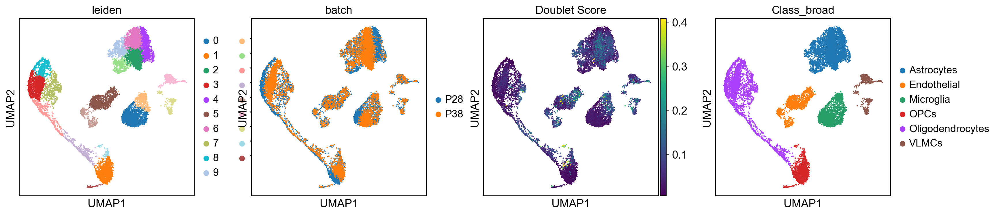

In [293]:
sc.pl.umap(adata_dr, color=['leiden', 'batch', 'Doublet Score', 'Class_broad'])

## By age_dr

In [294]:
P28_dr = adata_dr[adata_dr.obs.batch=='P28',:]
print(P28_dr.shape)

P38_dr = adata_dr[adata_dr.obs.batch=='P38',:]
print(P38_dr.shape)

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


(6372, 21549)
(6063, 21549)


Number above will change as each age gets refined.

In [315]:
for i in [P28_dr, P38_dr]:

    del i.obsp
    del i.varm
    del i.obsm
    del i.uns


    i.X = i.raw.X
    sc.pp.highly_variable_genes(i, min_mean=0.0125, max_mean=3, min_disp=0.5) #HVGs


    sc.pp.scale(i, max_value=10) #scale
    sc.tl.pca(i, svd_solver='arpack') #run PCA

    Z = harmonize(i.obsm['X_pca'], i.obs, batch_key = 'sample')
    i.obsm['X_harmony'] = Z

    sc.pp.neighbors(i, n_neighbors=25, use_rep='X_harmony')
    
    #sc.pp.neighbors(i, n_neighbors=25)
    #bbknn(i, batch_key='sample',neighbors_within_batch =6 ) #doesn't work
    sc.tl.leiden(i)
    sc.tl.umap(i)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


    finished (0:00:04)
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
Reach convergence after 3 iteration(s).
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
running Leiden clustering
    finished: found 15 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:13)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with 

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


    finished (0:00:03)
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
Reach convergence after 4 iteration(s).
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
running Leiden clustering
    finished: found 14 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:13)


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


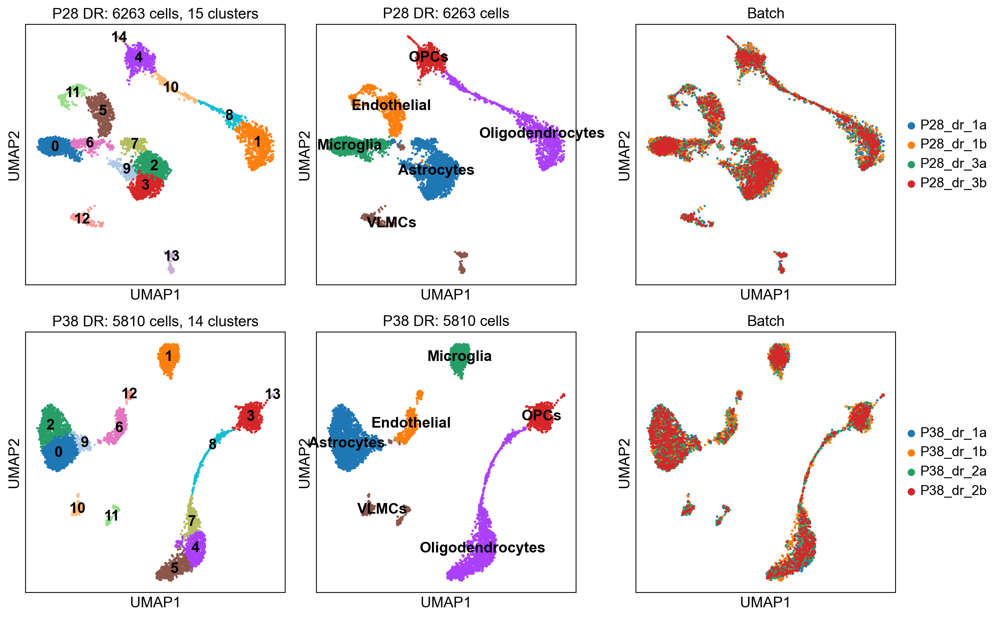

In [363]:
fig, axs = plt.subplots(2, 3, figsize = (13,8), constrained_layout=True)

age_idx = 0
column_idx = 0 
for obj in [P28_dr, P38_dr]:

    sc.pl.umap(obj, color='leiden', ax=axs[age_idx,column_idx], show=False, 
               title= str(obj.obs.batch[0]) + ' DR: ' + str(obj.shape[0]) + ' cells, ' + str(len(obj.obs.leiden.values.categories)) + ' clusters', 
               legend_loc='on data')
    column_idx = column_idx + 1
    
    sc.pl.umap(obj, color='Class_broad', ax=axs[age_idx,column_idx], show=False, 
               title= str(obj.obs.batch[0]) + ' DR: ' + str(obj.shape[0]) + ' cells', legend_loc='on data')
    column_idx = column_idx + 1

    sc.pl.umap(obj, color='sample', ax=axs[age_idx,column_idx], show=False, title='Batch')

    column_idx = column_idx + 1

    if (column_idx>=2): 
        age_idx = age_idx + 1
        column_idx = 0

In [364]:
fig.savefig('umap_DR_glia_indiv.pdf')

### P28_dr

P28_dr = P28_dr[P28_dr.obs.leiden!='15',:]

P28_dr = P28_dr[P28_dr.obs.leiden!='14',:]

Storing dendrogram info using `.uns["dendrogram_['leiden']"]`


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


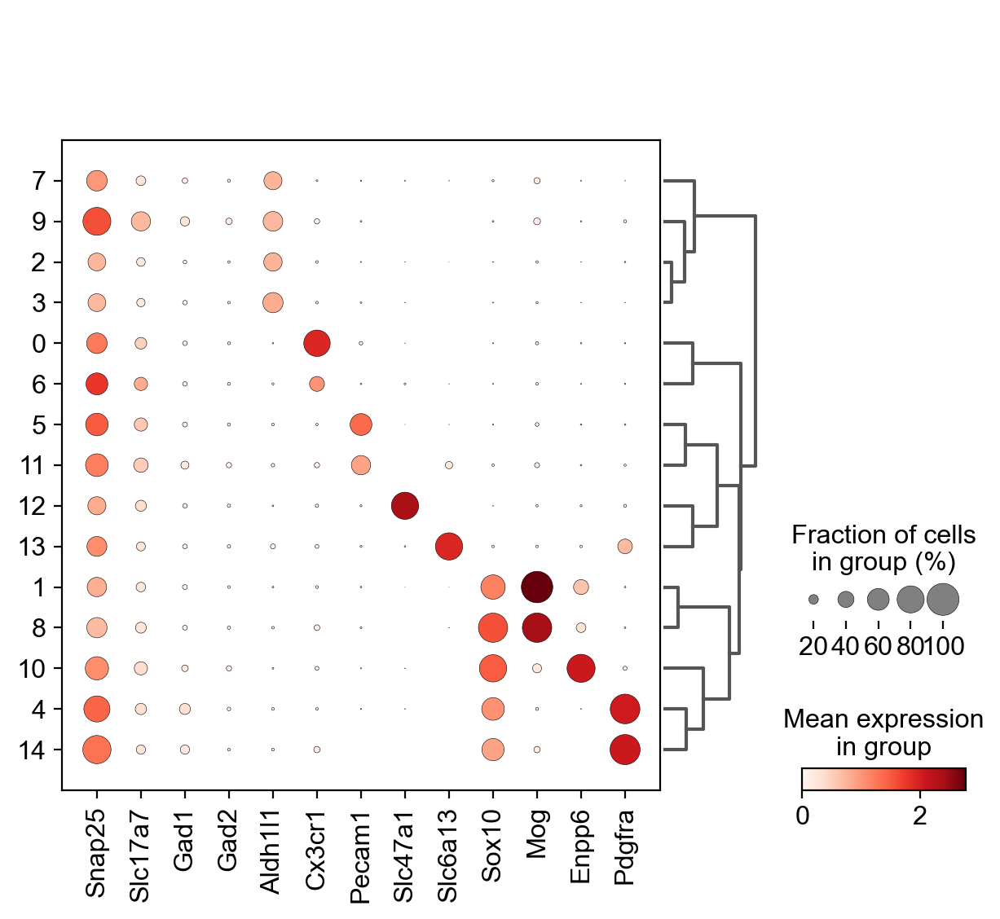

In [318]:
markers = ['Snap25', 'Slc17a7', 'Gad1', 'Gad2', 
           'Aldh1l1', 'Cx3cr1', 'Pecam1', 'Slc47a1', 'Slc6a13', 'Sox10', 'Mog', 'Enpp6',  'Pdgfra']

sc.tl.dendrogram(P28_dr, groupby='leiden', use_rep='X_harmony')
sc.pl.dotplot(P28_dr, markers, groupby='leiden', dendrogram=True)

### P38_dr

P38_dr = P38_dr[P38_dr.obs.leiden!='14',:]
P38_dr = P38_dr[P38_dr.obs.leiden!='8',:]

P38_dr = P38_dr[P38_dr.obs.leiden!='13',:]

Storing dendrogram info using `.uns["dendrogram_['leiden']"]`


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


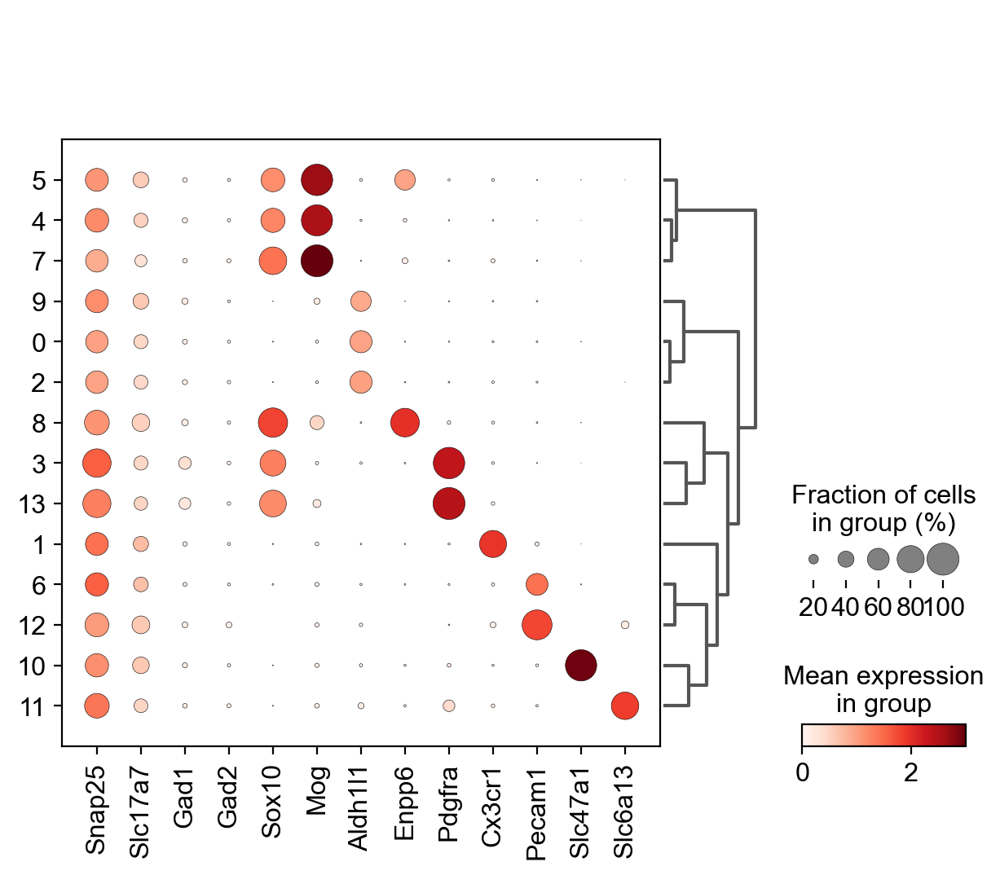

In [321]:
markers = ['Snap25', 'Slc17a7', 'Gad1', 'Gad2', 
           'Sox10', 'Mog', 'Aldh1l1','Enpp6',  'Pdgfra', 'Cx3cr1', 'Pecam1', 'Slc47a1', 'Slc6a13']

sc.tl.dendrogram(P38_dr, groupby='leiden', use_rep='X_harmony')
sc.pl.dotplot(P38_dr, markers, groupby='leiden', dendrogram=True)

## Output DR objs

In [365]:

for i in [P28_dr, P38_dr]: i.write_h5ad(out_path + i.obs.batch[0] + '_non_analyzed_DR.h5ad')

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


## Read DR objs after kernel dies

In [3]:

P28_dr = sc.read_h5ad(in_path + 'P28' + '_non_analyzed_DR.h5ad')
P38_dr = sc.read_h5ad(in_path + 'P38' + '_non_analyzed_DR.h5ad')

# DR Astrocytes

## P28_astro DR

In [176]:
P28_astro_dr = P28_dr[P28_dr.obs.leiden=='2',:].concatenate(P28_dr[P28_dr.obs.leiden=='3',:], 
                                                           P28_dr[P28_dr.obs.leiden=='7',:], 
                                                           P28_dr[P28_dr.obs.leiden=='9',:])

In [177]:
np.where(P28_astro_dr.obsm['X_umap'][:,1]==10.052226)

(array([1832]),)

In [178]:
a = list(P28_astro_dr.obs.index)
del a[1832]

In [179]:
P28_astro_dr = P28_astro_dr[a,:]
P28_astro_dr

View of AnnData object with n_obs × n_vars = 1959 × 21549
    obs: 'percent_mito', 'n_counts', 'Doublet', 'Doublet Score', 'batch', 'sample', 'n_genes', 'leiden', 'Class_broad'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'mean', 'std', 'dispersions-0', 'dispersions_norm-0', 'dispersions-1', 'dispersions_norm-1', 'dispersions-2', 'dispersions_norm-2', 'dispersions-3', 'dispersions_norm-3'
    obsm: 'X_harmony', 'X_pca', 'X_umap'

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


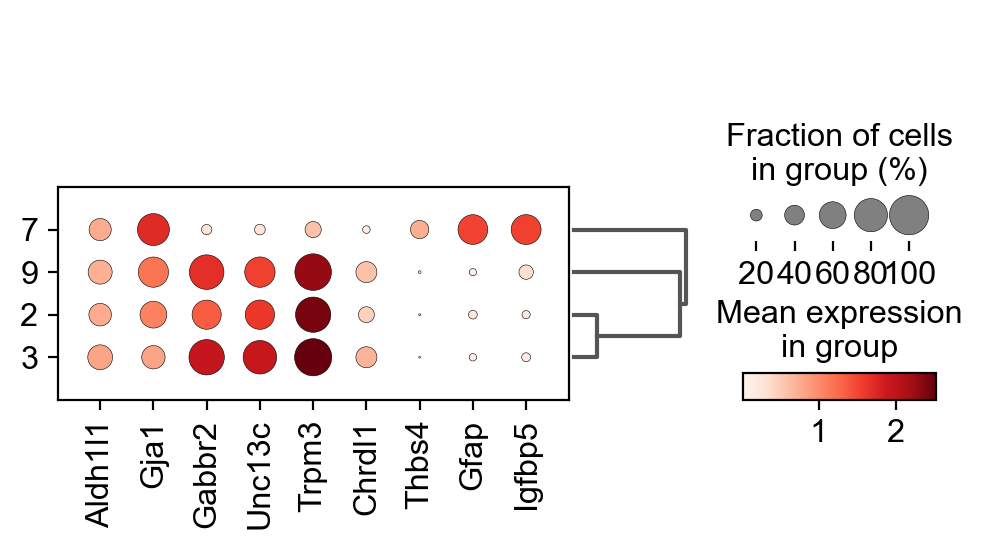

In [164]:
#['Aldh1l1', 'Gja1',
#                 'Gabbr2', 'Unc13c', 'Trpm3', 'Chrdl1',
#                'Thbs4', 'Gfap', 'Igfbp5']
sc.pl.dotplot(P28_astro_dr, astro_markers, groupby='leiden', dendrogram=True)

In [181]:
P28_astro_dr_clust = []
for i in range(P28_astro_dr.shape[0]):
    if ( int(P28_astro_dr.obs.leiden[i]) in (2, 3, 9) ): P28_astro_dr_clust.append('Astro_C1')
    elif ( int(P28_astro_dr.obs.leiden[i]) in (7, 4242) ): P28_astro_dr_clust.append('Astro_C2')

P28_astro_dr.obs['Astro_Num'] = P28_astro_dr.obs['leiden']
P28_astro_dr.obs['Astro_Num'] = pd.Series(P28_astro_dr_clust, dtype='category').values

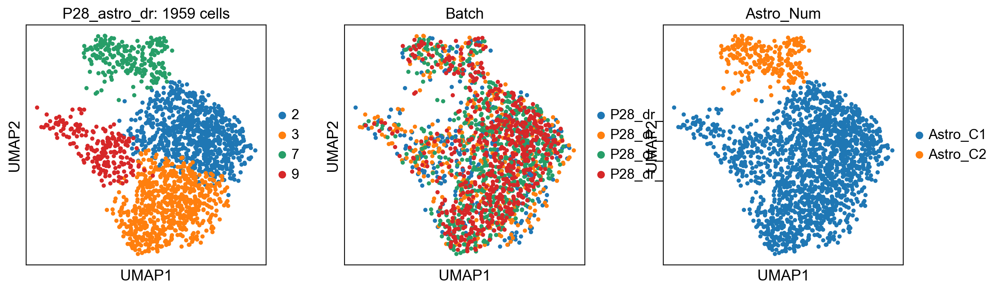

In [182]:
sc.pl.umap(P28_astro_dr, color=['leiden', 'sample', 'Astro_Num'], 
           title=['P28_astro_dr: ' + str(P28_astro_dr.shape[0]) + ' cells', 'Batch'])

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


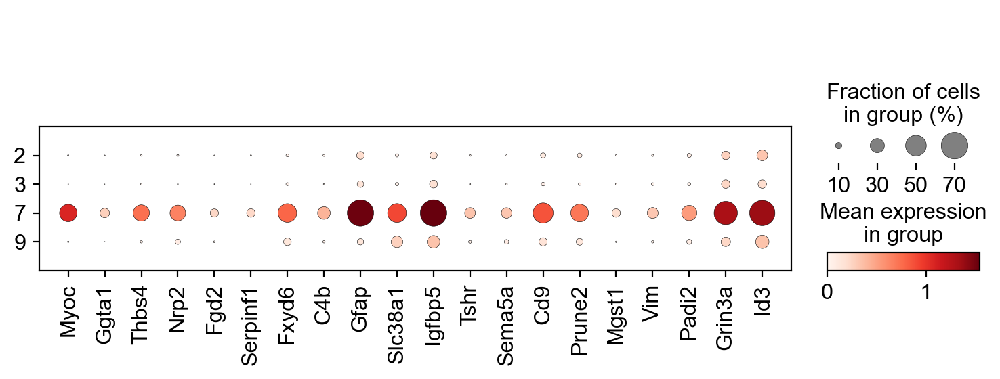

['Myoc', 'Ggta1', 'Thbs4', 'Nrp2', 'Fgd2', 'Serpinf1']
ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


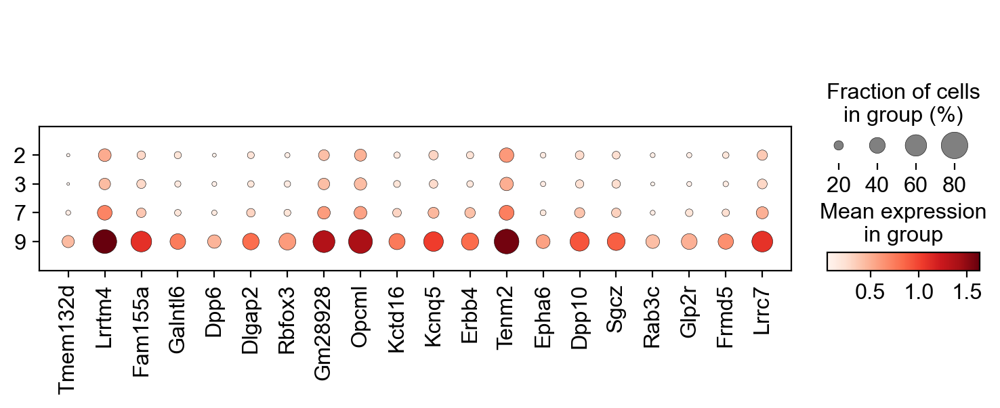

['Tmem132d', 'Lrrtm4', 'Fam155a', 'Galntl6', 'Dpp6', 'Dlgap2']
ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:03)


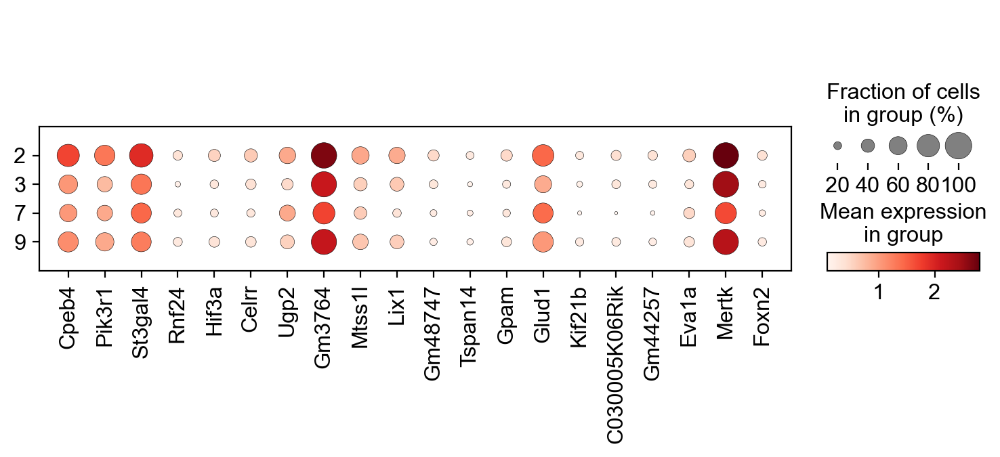

['Cpeb4', 'Pik3r1', 'St3gal4', 'Rnf24', 'Hif3a', 'Celrr']
ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


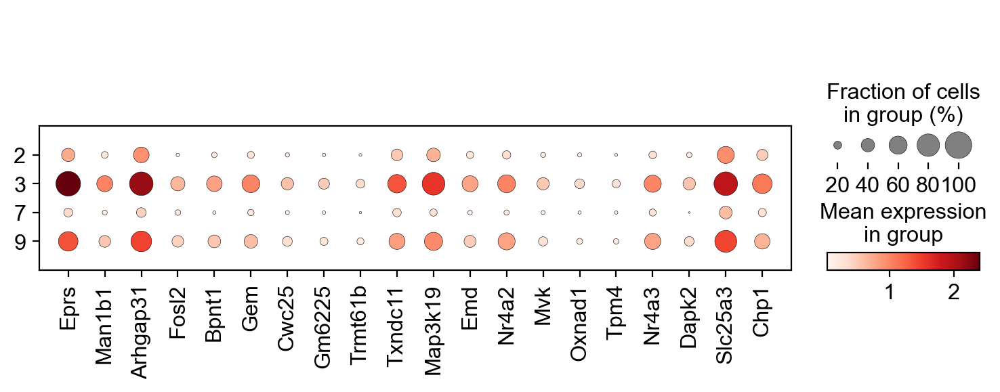

['Eprs', 'Man1b1', 'Arhgap31', 'Fosl2', 'Bpnt1', 'Gem']


In [140]:
#sc.tl.dendrogram(P28_astro_dr, groupby='leiden', use_rep='X_harmony')
for i in P28_astro_dr.uns["dendrogram_['leiden']"]['dendrogram_info']['ivl']:
    leiden = i
    sc.tl.rank_genes_groups(P28_astro_dr, groupby='leiden', groups=[leiden], reference='rest', method='wilcoxon', n_genes=250)
    #wilcGenes23vRest = list(P28_astro_dr.uns['rank_genes_groups']['names'].astype([(leiden, '<U50')]).view('<U50'))  #list of genes ordered by wilc score
    #if ('Malat1' in wilcGenes23vRest): del wilcGenes23vRest[wilcGenes23vRest.index('Malat1')]

    wilcLF8v14 = P28_astro_dr.uns['rank_genes_groups']['logfoldchanges'].astype([(leiden, '<f8')]).view('<f8') #log fold changes ordered by score

    wilcGenes8v14_s = list(P28_astro_dr.uns['rank_genes_groups']['names'].astype([(leiden, '<U50')]).view('<U50'))  #list of genes ordered by wilc score
    wilcLF8v14_s = P28_astro_dr.uns['rank_genes_groups']['logfoldchanges'].astype([(leiden, '<f8')]).view('<f8') #numpy array of logfoldchnages to be ordered lowest to highest
    wilcLF8v14_s.sort() #log fold changes from lowest to highest
    wilcGenes8v14 = [] #list of genes ordered by logfold change: low to high
    for i in wilcLF8v14_s:
        gene_idx = np.where(wilcLF8v14 == i)[0][0]
        wilcGenes8v14.append(wilcGenes8v14_s[gene_idx])
    wilcGenes8v14_correct = []
    for i in reversed(wilcGenes8v14):
        wilcGenes8v14_correct.append(i) # #list of genes ordered by logfold change high to low

    sc.pl.dotplot(P28_astro_dr, wilcGenes8v14_correct[0:20], groupby='leiden')
    print(wilcGenes8v14_correct[0:6])

In [373]:
P28_astro_dr = P28_dr[P28_dr.obs.leiden=='2',:].concatenate(P28_dr[P28_dr.obs.leiden=='3',:], 
                                                           P28_dr[P28_dr.obs.leiden=='7',:], 
                                                           P28_dr[P28_dr.obs.leiden=='9',:])

del P28_astro_dr.obsp
del P28_astro_dr.varm
del P28_astro_dr.obsm
del P28_astro_dr.uns


P28_astro_dr.X = P28_astro_dr.raw.X
sc.pp.highly_variable_genes(P28_astro_dr, min_mean=0.0125, max_mean=3, min_disp=0.5) #HVGs


sc.pp.scale(P28_astro_dr, max_value=10) #scale
sc.tl.pca(P28_astro_dr, svd_solver='arpack') #run PCA

Z = harmonize(P28_astro_dr.obsm['X_pca'], P28_astro_dr.obs, batch_key = 'sample')
P28_astro_dr.obsm['X_harmony'] = Z

sc.pp.neighbors(P28_astro_dr, n_neighbors=25, use_rep='X_harmony')
#bbknn(P28_astro_dr, batch_key='sample',neighbors_within_batch =6 ) #doesn't work
#sc.tl.leiden(P28_astro_dr)
sc.tl.umap(P28_astro_dr)

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
Reach convergence after 2 iteration(s).
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:04)


running Leiden clustering
    finished: found 9 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:01)


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'Class_broad' as categorical


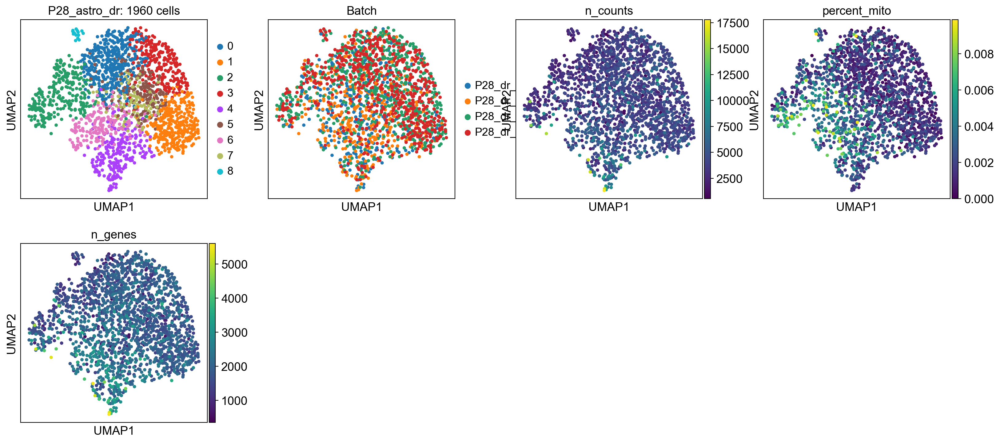

In [374]:
sc.tl.leiden(P28_astro_dr)
sc.pl.umap(P28_astro_dr, color=['leiden', 'sample', 'n_counts', 'percent_mito', 'n_genes'], 
           title=['P28_astro_dr: ' + str(P28_astro_dr.shape[0]) + ' cells', 'Batch'])

## P38_astro DR

P38_dr to P38_nr:

* 0 maps to 0: C1
* 2 maps to 0: C1
* 9 maps to 7: C2

In [131]:
P38_astro_dr = P38_dr[P38_dr.obs.leiden=='0',:].concatenate(P38_dr[P38_dr.obs.leiden=='2',:], 
                                                           P38_dr[P38_dr.obs.leiden=='9',:])

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


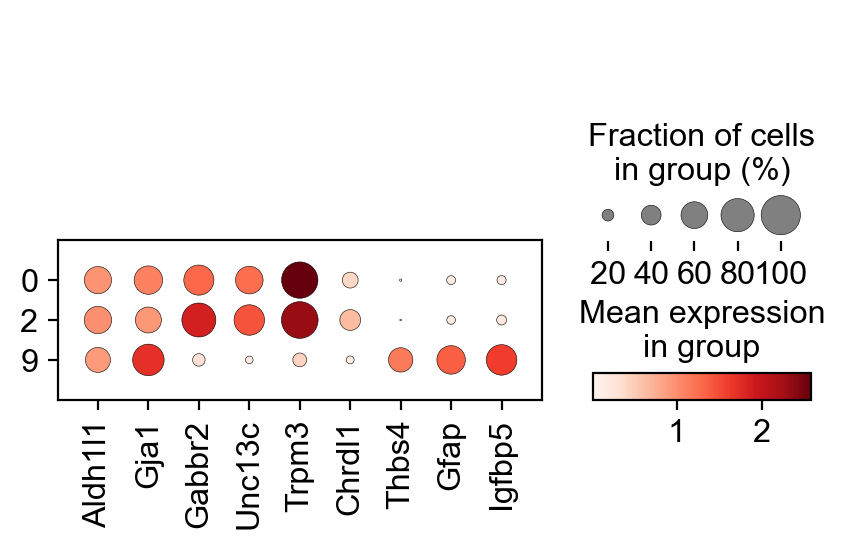

In [142]:
astro_markers = ['Aldh1l1', 'Gja1',
                 'Gabbr2', 'Unc13c', 'Trpm3', 'Chrdl1',
                'Thbs4', 'Gfap', 'Igfbp5']
sc.pl.dotplot(P38_astro_dr, astro_markers, groupby='leiden')

In [183]:
P38_astro_dr_clust = []
for i in range(P38_astro_dr.shape[0]):
    if ( int(P38_astro_dr.obs.leiden[i]) in (0, 2) ): P38_astro_dr_clust.append('Astro_C1')
    elif ( int(P38_astro_dr.obs.leiden[i]) in (9, 4242) ): P38_astro_dr_clust.append('Astro_C2')

P38_astro_dr.obs['Astro_Num'] = P38_astro_dr.obs['leiden']
P38_astro_dr.obs['Astro_Num'] = pd.Series(P38_astro_dr_clust, dtype='category').values

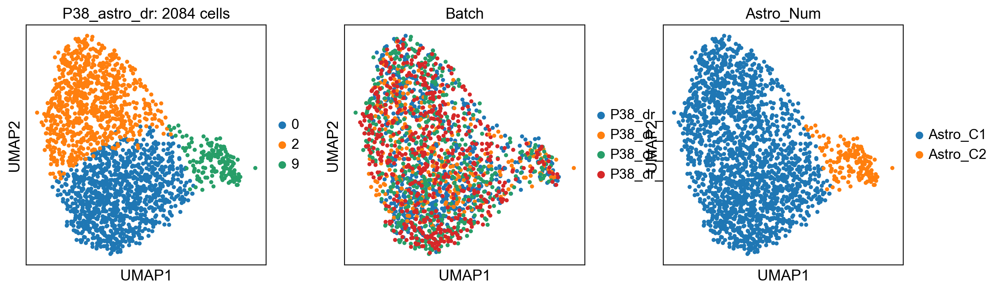

In [185]:
sc.pl.umap(P38_astro_dr, color=['leiden', 'sample', 'Astro_Num'],
           title=['P38_astro_dr: ' + str(P38_astro_dr.shape[0]) + ' cells', 'Batch'])

Storing dendrogram info using `.uns["dendrogram_['leiden']"]`
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


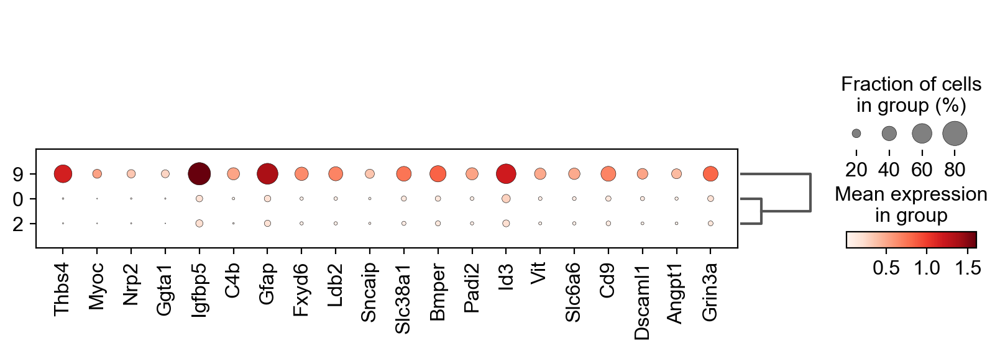

['Thbs4', 'Myoc', 'Nrp2', 'Ggta1', 'Igfbp5', 'C4b']
ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:03)


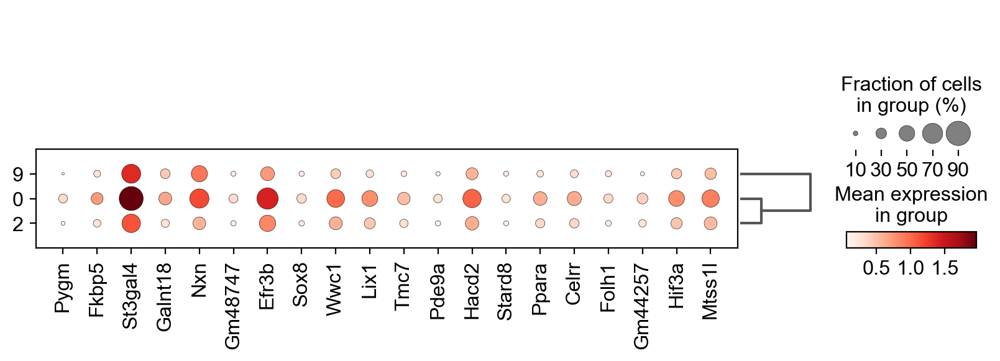

['Pygm', 'Fkbp5', 'St3gal4', 'Galnt18', 'Nxn', 'Gm48747']
ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:03)


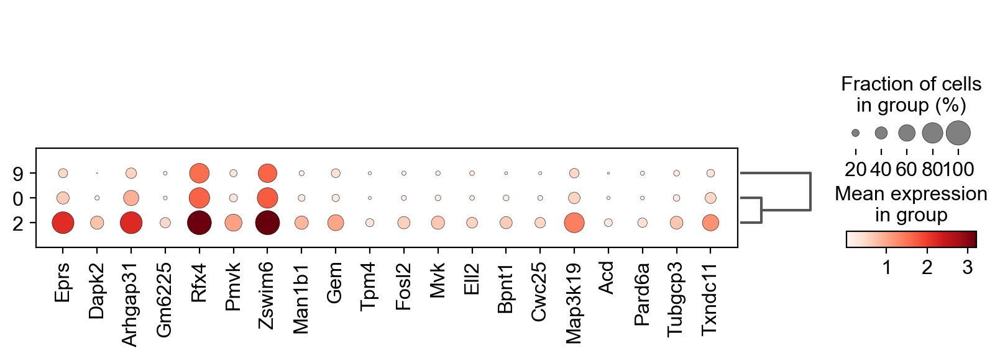

['Eprs', 'Dapk2', 'Arhgap31', 'Gm6225', 'Rfx4', 'Pmvk']


In [135]:
sc.tl.dendrogram(P38_astro_dr, groupby='leiden', use_rep='X_harmony')

for i in P38_astro_dr.uns["dendrogram_['leiden']"]['dendrogram_info']['ivl']:
    leiden = i
    sc.tl.rank_genes_groups(P38_astro_dr, groupby='leiden', groups=[leiden], reference='rest', method='wilcoxon', n_genes=250)
    #wilcGenes23vRest = list(P38_astro_dr.uns['rank_genes_groups']['names'].astype([(leiden, '<U50')]).view('<U50'))  #list of genes ordered by wilc score
    #if ('Malat1' in wilcGenes23vRest): del wilcGenes23vRest[wilcGenes23vRest.index('Malat1')]

    wilcLF8v14 = P38_astro_dr.uns['rank_genes_groups']['logfoldchanges'].astype([(leiden, '<f8')]).view('<f8') #log fold changes ordered by score

    wilcGenes8v14_s = list(P38_astro_dr.uns['rank_genes_groups']['names'].astype([(leiden, '<U50')]).view('<U50'))  #list of genes ordered by wilc score
    wilcLF8v14_s = P38_astro_dr.uns['rank_genes_groups']['logfoldchanges'].astype([(leiden, '<f8')]).view('<f8') #numpy array of logfoldchnages to be ordered lowest to highest
    wilcLF8v14_s.sort() #log fold changes from lowest to highest
    wilcGenes8v14 = [] #list of genes ordered by logfold change: low to high
    for i in wilcLF8v14_s:
        gene_idx = np.where(wilcLF8v14 == i)[0][0]
        wilcGenes8v14.append(wilcGenes8v14_s[gene_idx])
    wilcGenes8v14_correct = []
    for i in reversed(wilcGenes8v14):
        wilcGenes8v14_correct.append(i) # #list of genes ordered by logfold change high to low

    sc.pl.dotplot(P38_astro_dr, wilcGenes8v14_correct[0:20], groupby='leiden', dendrogram=True)
    print(wilcGenes8v14_correct[0:6])

In [375]:
P38_astro_dr = P38_dr[P38_dr.obs.leiden=='0',:].concatenate(P38_dr[P38_dr.obs.leiden=='2',:], 
                                                           P38_dr[P38_dr.obs.leiden=='9',:])

del P38_astro_dr.obsp
del P38_astro_dr.varm
del P38_astro_dr.obsm
del P38_astro_dr.uns


P38_astro_dr.X = P38_astro_dr.raw.X
sc.pp.highly_variable_genes(P38_astro_dr, min_mean=0.0125, max_mean=3, min_disp=0.5) #HVGs


sc.pp.scale(P38_astro_dr, max_value=10) #scale
sc.tl.pca(P38_astro_dr, svd_solver='arpack') #run PCA

Z = harmonize(P38_astro_dr.obsm['X_pca'], P38_astro_dr.obs, batch_key = 'sample')
P38_astro_dr.obsm['X_harmony'] = Z

sc.pp.neighbors(P38_astro_dr, n_neighbors=25, use_rep='X_harmony')
#bbknn(P38_astro_dr, batch_key='sample',neighbors_within_batch =6 ) #doesn't work
#sc.tl.leiden(P38_astro_dr)
sc.tl.umap(P38_astro_dr)

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:01)
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
	Completed 7 / 10 iteration(s).
	Completed 8 / 10 iteration(s).
	Completed 9 / 10 iteration(s).
	Completed 10 / 10 iteration(s).
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: 

running Leiden clustering
    finished: found 15 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


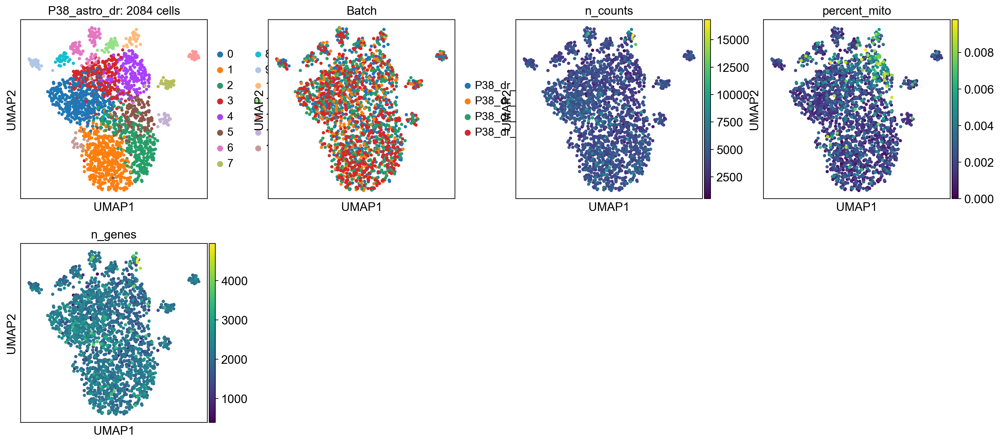

In [376]:
sc.tl.leiden(P38_astro_dr)
sc.pl.umap(P38_astro_dr, color=['leiden', 'sample', 'n_counts', 'percent_mito', 'n_genes'], 
           title=['P38_astro_dr: ' + str(P38_astro_dr.shape[0]) + ' cells', 'Batch'])

## Astro_C1 and C2 analysis DR

In [190]:
astro_dr_objs = [P28_astro_dr, P38_astro_dr]

ages = ['P28', 'P38']
idx = 0
for curr_astro_obj in astro_dr_objs:
    astro_clust_age = []
    for i in range(curr_astro_obj.shape[0]):
        astro_clust_age.append(ages[idx] + '_' + curr_astro_obj.obs.Astro_Num[i])
    curr_astro_obj.obs['Age_Astro_Num'] = curr_astro_obj.obs['Astro_Num']
    curr_astro_obj.obs['Age_Astro_Num'] = pd.Series(astro_clust_age, dtype='category').values
    idx = idx + 1

astro_dr_concat = P28_astro_dr.concatenate(P38_astro_dr, batch_categories=ages)

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


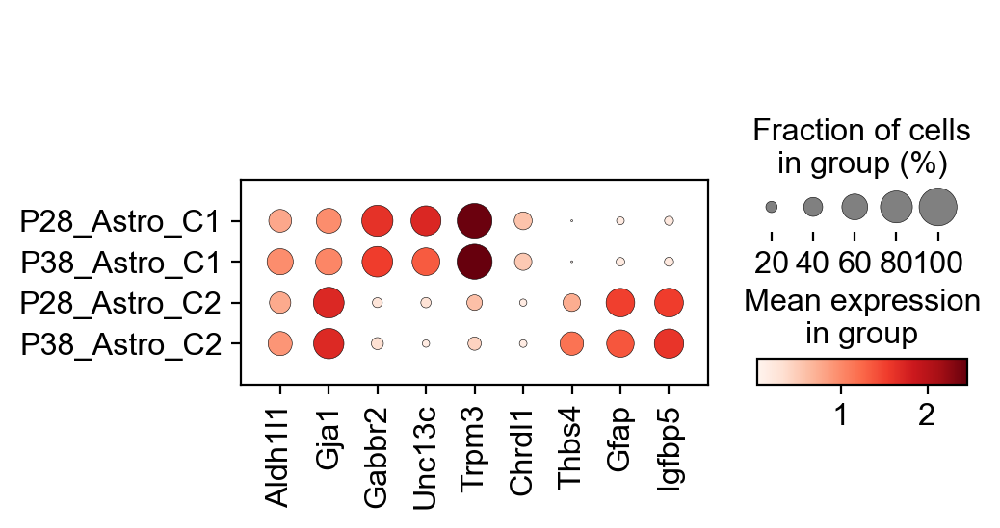

In [193]:
astro_markers = ['Aldh1l1', 'Gja1',
                 'Gabbr2', 'Unc13c', 'Trpm3', 'Chrdl1',
                'Thbs4', 'Gfap', 'Igfbp5']
sc.pl.dotplot(astro_dr_concat, astro_markers, groupby='Age_Astro_Num', 
              categories_order=['P28_Astro_C1', 'P38_Astro_C1', 
                                'P28_Astro_C2', 'P38_Astro_C2'], save='astro_dr_num.pdf')

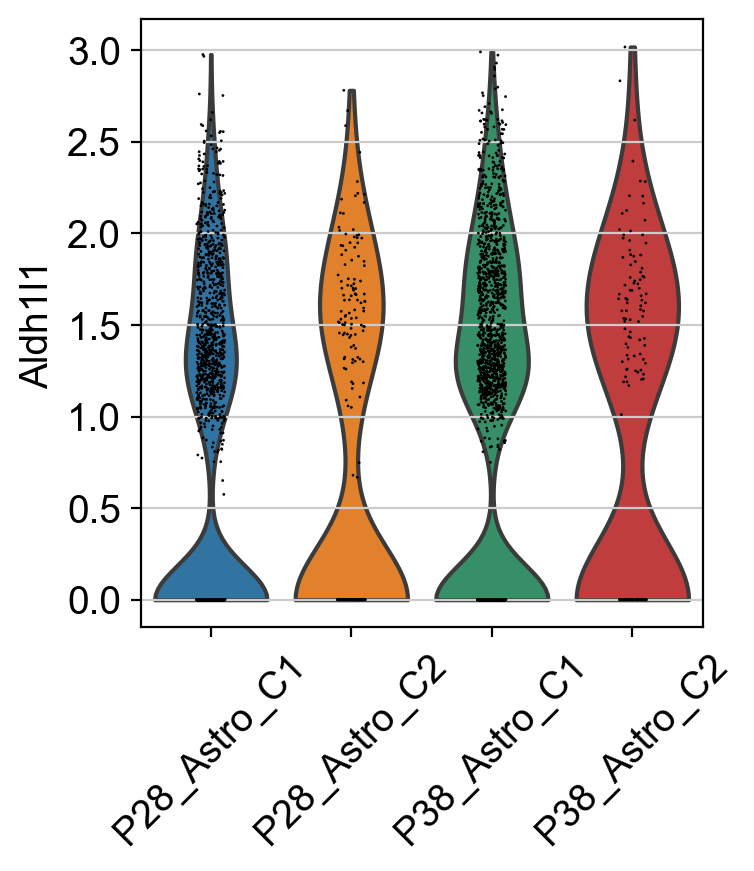

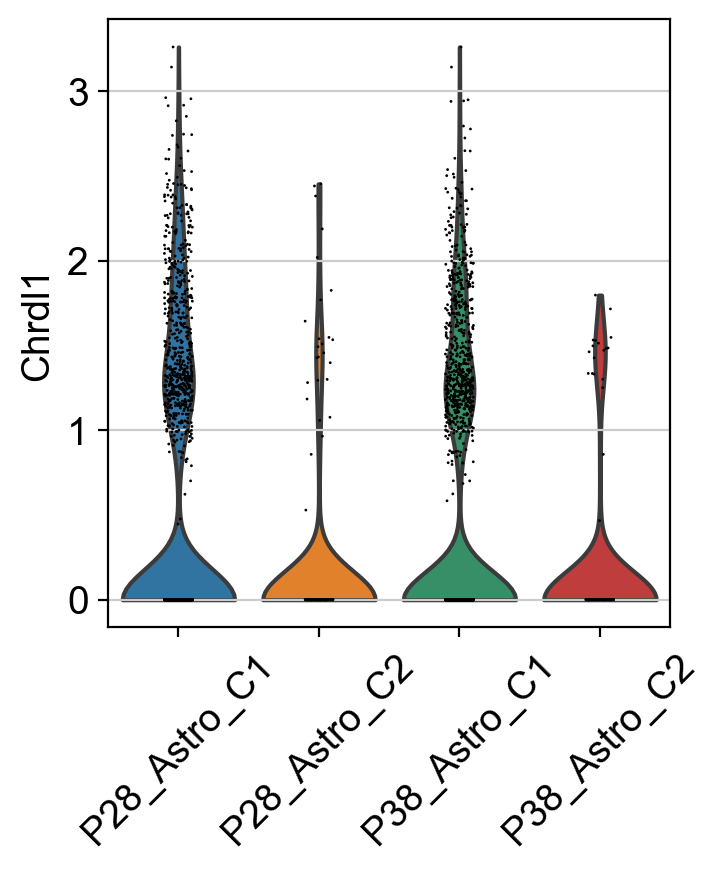

In [203]:
sc.pl.violin(astro_dr_concat, 'Aldh1l1', groupby='Age_Astro_Num', rotation=45)
sc.pl.violin(astro_dr_concat, 'Chrdl1', groupby='Age_Astro_Num', rotation=45)

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


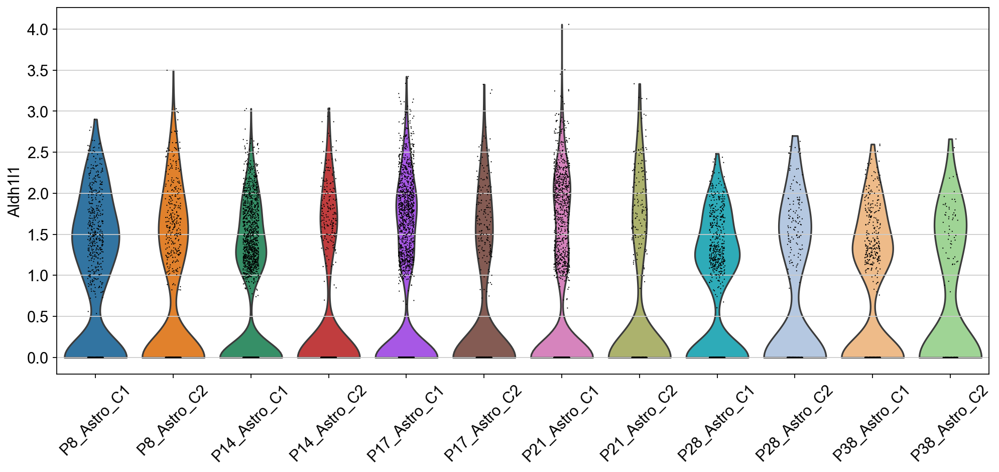

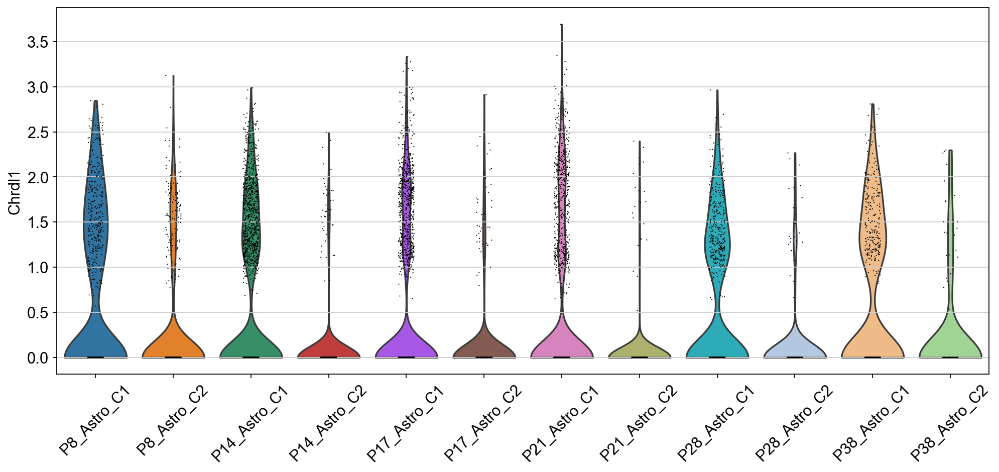

In [208]:
sc.set_figure_params(figsize=(12,6))
sc.pl.violin(astro_concat, 'Aldh1l1', groupby='Age_Astro_Num', rotation=45)
sc.pl.violin(astro_concat, 'Chrdl1', groupby='Age_Astro_Num', rotation=45)

# DL non-neurons

## Pre-clustering

In [295]:
adata_dl = sc.read_h5ad('P28_dl_raw_unfiltered.h5ad')

In [298]:
P28_dl = adata_dl[all_glia_DL_correct,:]

In [306]:
P28_dl = P28_dl[P28_dl.obs.Doublet==False,:]
P28_dl

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


View of AnnData object with n_obs × n_vars = 7057 × 53801
    obs: 'percent_mito', 'n_counts', 'Doublet', 'Doublet Score', 'batch'
    var: 'gene_ids', 'feature_types'

In [307]:
sc.pp.filter_genes(P28_dl, min_cells=8)
sc.pp.filter_cells(P28_dl, min_genes=0) #just want n_genes to be computed

filtered out 34578 genes that are detected in less than 8 cells


Trying to set attribute `.var` of view, copying.


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


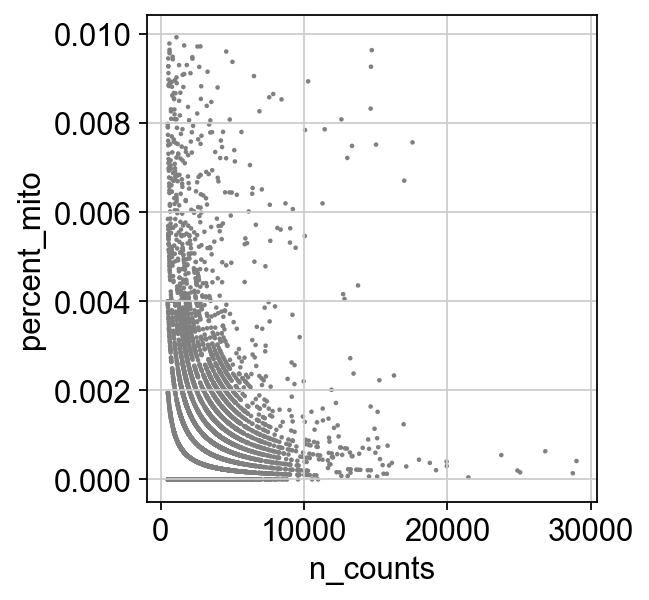

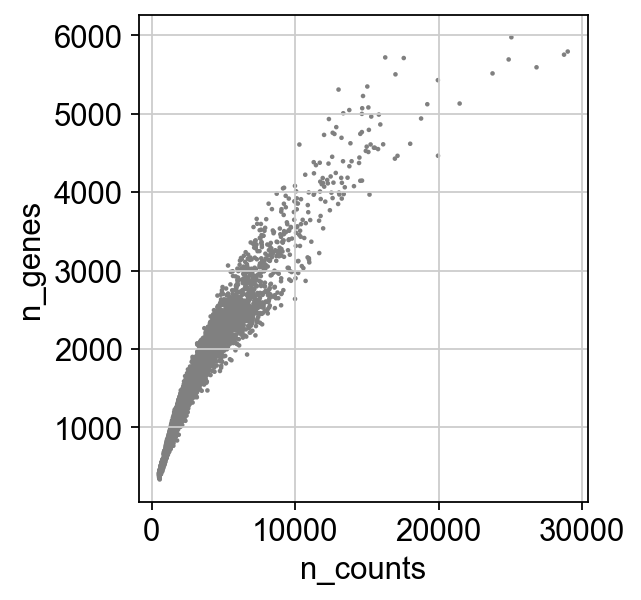

In [308]:
sc.pl.scatter(P28_dl, x='n_counts', y='percent_mito')
sc.pl.scatter(P28_dl, x='n_counts', y='n_genes')

In [309]:
P28_dl = P28_dl[P28_dl.obs['n_counts'] < 15000, :]

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [310]:
P28_dl

View of AnnData object with n_obs × n_vars = 7027 × 19223
    obs: 'percent_mito', 'n_counts', 'Doublet', 'Doublet Score', 'batch', 'n_genes'
    var: 'gene_ids', 'feature_types', 'n_cells'

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


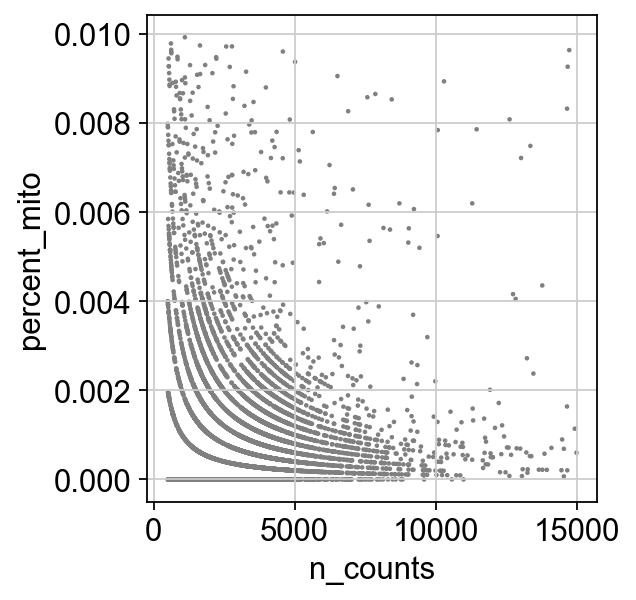

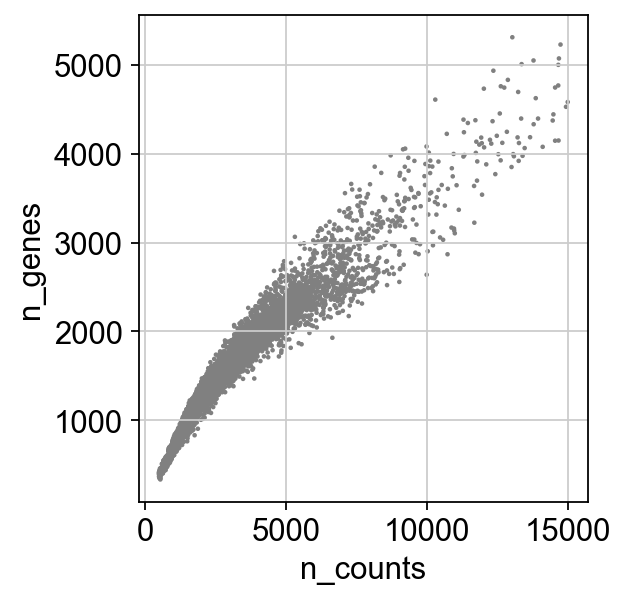

In [311]:
sc.pl.scatter(P28_dl, x='n_counts', y='percent_mito')
sc.pl.scatter(P28_dl, x='n_counts', y='n_genes')

In [312]:
P28_dl.X.A

array([[0., 0., 0., ..., 0., 3., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [3., 1., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 3., 0.]], dtype=float32)

In [313]:
sc.pp.normalize_per_cell(P28_dl, counts_per_cell_after=1e4)
sc.pp.log1p(P28_dl)

normalizing by total count per cell


Trying to set attribute `.obs` of view, copying.


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


In [314]:
P28_dl.raw = P28_dl #store pre-scale counts

In [333]:
P28_dl.X = P28_dl.raw.X.A
sc.pp.highly_variable_genes(P28_dl, min_mean=0.0125, max_mean=3, min_disp=0.5) #HVGs

sc.pp.scale(P28_dl, max_value=10) #scale
sc.tl.pca(P28_dl, svd_solver='arpack') #run PCA

sc.pp.neighbors(P28_dl, n_neighbors=25)
#bbknn(i, batch_key='sample',neighbors_within_batch =6 ) #doesn't work
sc.tl.leiden(P28_dl)
sc.tl.umap(P28_dl)

extracting highly variable genes
    finished (0:00:02)


Trying to set attribute `.uns` of view, copying.


--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:03)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
running Leiden clustering
    finished: found 13 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:13)


P28_dl = P28_dl[P28_dl.obs.leiden!='17',:]
P28_dl = P28_dl[P28_dl.obs.leiden!='7',:]
P28_dl = P28_dl[P28_dl.obs.leiden!='18',:]

P28_dl = P28_dl[P28_dl.obs.leiden!='15',:]

P28_dl = P28_dl[P28_dl.obs.leiden!='15',:]
P28_dl = P28_dl[P28_dl.obs.leiden!='14',:]

## Clustering

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  


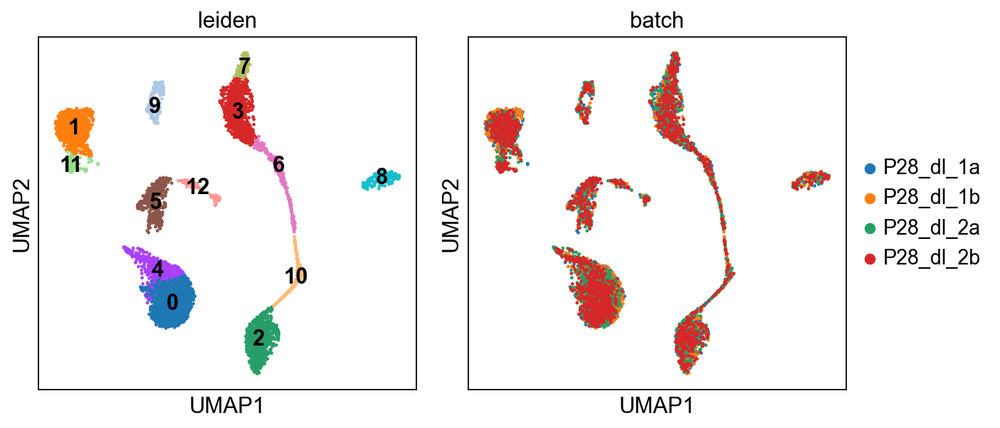

In [334]:
fig, axs = plt.subplots(1,2, figsize=(9,4), constrained_layout=True)


sc.pl.umap(P28_dl, color=['leiden'], ax=axs[0], show=False, legend_loc='on data')
sc.pl.umap(P28_dl, color=['batch'], ax=axs[1], show=False)
plt.tight_layout()

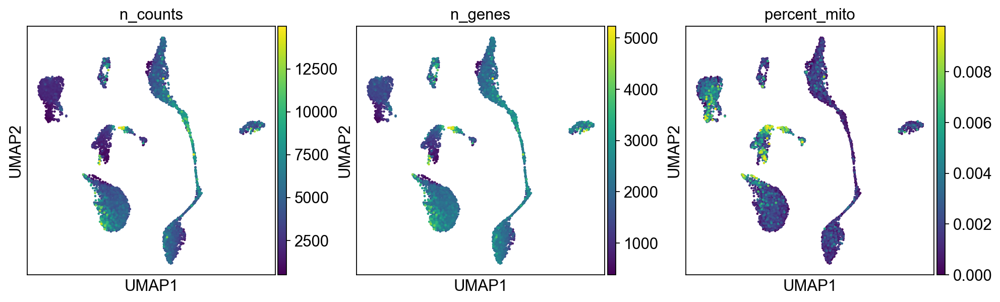

In [335]:
sc.pl.umap(P28_dl, color=['n_counts', 'n_genes', 'percent_mito'])

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


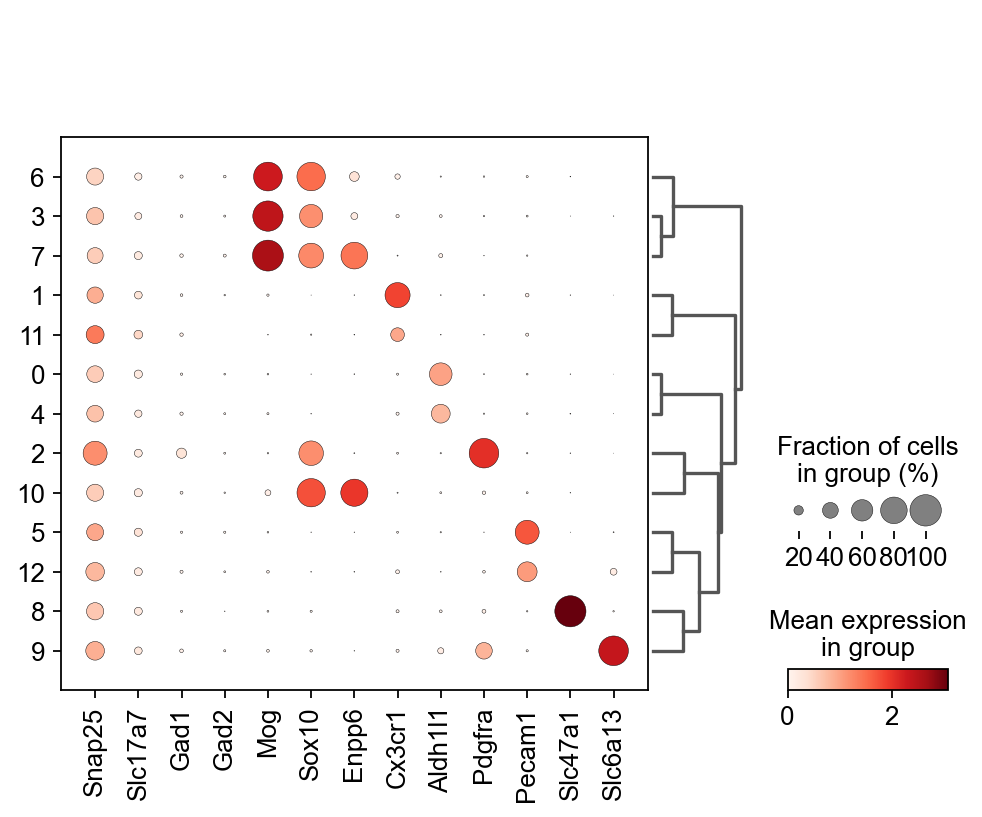

In [339]:
markers = ['Snap25', 'Slc17a7', 'Gad1', 'Gad2',
                  'Mog', 'Sox10',  'Enpp6',   'Cx3cr1','Aldh1l1', 
           'Pdgfra', 'Pecam1','Slc47a1', 'Slc6a13',]
#sc.tl.dendrogram(P28_dl, groupby='leiden')
sc.pl.dotplot(P28_dl, markers, groupby='leiden', dendrogram=True)

In [340]:
Class_broad = []
for i in range(P28_dl.shape[0]):
    if (int(P28_dl.obs['leiden'][i]) in (1, 11)): Class_broad.append('Microglia')
    elif (int(P28_dl.obs['leiden'][i]) in (0, 4)): Class_broad.append('Astrocytes')
    elif (int(P28_dl.obs['leiden'][i]) in (7, 10, 6, 3)): Class_broad.append('Oligodendrocytes')
    elif (int(P28_dl.obs['leiden'][i]) in (2, 878687)): Class_broad.append('OPCs')
    elif (int(P28_dl.obs['leiden'][i]) in (5, 12)): Class_broad.append('Endothelial')
    elif (int(P28_dl.obs['leiden'][i]) in (8, 9)): Class_broad.append('VLMCs')

In [342]:
P28_dl.obs['Class_broad'] = P28_dl.obs['leiden']
P28_dl.obs['Class_broad'] = pd.Series(Class_broad, dtype='category').values

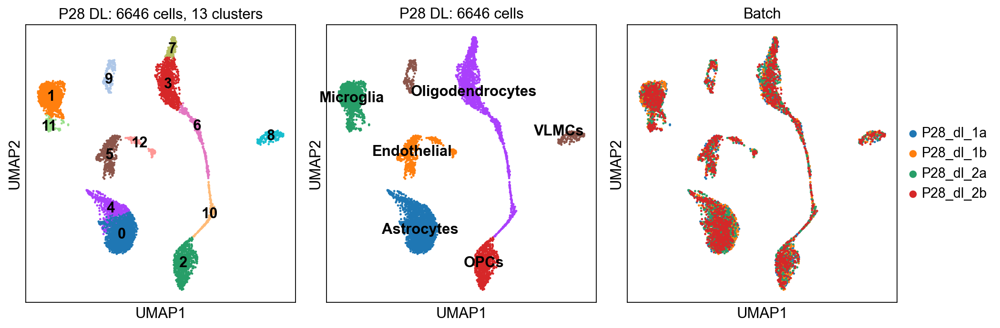

In [353]:
fig, axs = plt.subplots(1, 3, figsize = (13,4.2), constrained_layout=True)

obj = P28_dl

sc.pl.umap(obj, color='leiden', ax=axs[0], show=False, 
           title= 'P28' + ' DL: ' + str(obj.shape[0]) + ' cells, ' + str(len(obj.obs.leiden.values.categories)) + ' clusters', 
           legend_loc='on data')

sc.pl.umap(obj, color='Class_broad', ax=axs[1], show=False, 
           title= 'P28' + ' DL: ' + str(obj.shape[0]) + ' cells', legend_loc='on data')

sc.pl.umap(obj, color='batch', ax=axs[2], show=False, title='Batch')
fig.savefig('DL_glia_indiv_UMAP.pdf')

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


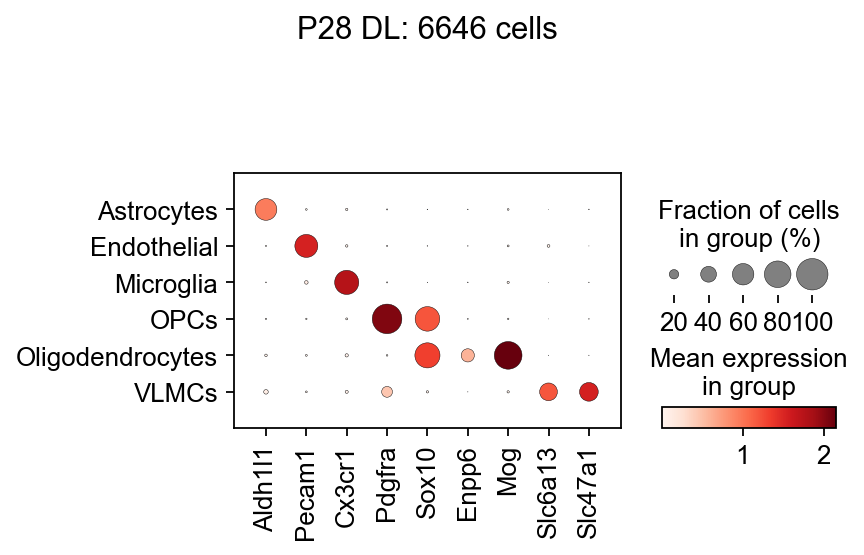

In [354]:
markers = ['Aldh1l1', 'Pecam1', 'Cx3cr1',   'Pdgfra', 'Sox10', 'Enpp6', 'Mog', 'Slc6a13', 'Slc47a1',]
#sc.tl.dendrogram(glia_final, groupby='Class_broad', use_rep='X_harmony')
sc.pl.dotplot(P28_dl, markers, groupby='Class_broad', 
              title='P28 DL: ' + str(P28_dl.shape[0]) + ' cells', save='_DL_Glia.pdf')

## Output DL object

In [357]:

P28_dl.write_h5ad(out_path + 'P28' + '_non_analyzed_DL.h5ad')

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


In [358]:
P28_dr

AnnData object with n_obs × n_vars = 6263 × 21549
    obs: 'percent_mito', 'n_counts', 'Doublet', 'Doublet Score', 'batch', 'sample', 'n_genes', 'leiden', 'Class_broad'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Class_broad_colors', "dendrogram_['leiden']", 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'sample_colors', 'umap'
    obsm: 'X_harmony', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

# DL Astrocytes

In [398]:
P28_astro_dl = P28_dl[P28_dl.obs.Class_broad=='Astrocytes',:]
P28_astro_dl.obs

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


,percent_mito,n_counts,Doublet,Doublet Score,batch,n_genes,leiden,Class_broad,sample
AAACGAATCTTGGAAC-1-P28_dl_1a,0.001173,3404.0,False,0.004501,P28_dl_1a,1865,4,Astrocytes,P28_dl_1a
AAAGGGCAGCGTTACT-1-P28_dl_1a,0.001895,2634.0,False,0.014875,P28_dl_1a,1459,0,Astrocytes,P28_dl_1a
AAAGTGACAATCTCTT-1-P28_dl_1a,0.000247,4040.0,False,0.016393,P28_dl_1a,1982,0,Astrocytes,P28_dl_1a
AACAACCAGTCATTGC-1-P28_dl_1a,0.000179,5580.0,False,0.007420,P28_dl_1a,2385,0,Astrocytes,P28_dl_1a
AACAACCCATCGAAGG-1-P28_dl_1a,0.000298,3359.0,False,0.005113,P28_dl_1a,1692,0,Astrocytes,P28_dl_1a
...,...,...,...,...,...,...,...,...,...
TTTGATCGTGTTCGAT-1-P28_dl_2b,0.000499,4008.0,False,0.006733,P28_dl_2b,1795,0,Astrocytes,P28_dl_2b
TTTGGTTAGACTTCAC-1-P28_dl_2b,0.001643,4865.0,False,0.017461,P28_dl_2b,2073,0,Astrocytes,P28_dl_2b
TTTGGTTTCTCCAATT-1-P28_dl_2b,0.000897,8909.0,False,0.015371,P28_dl_2b,3292,0,Astrocytes,P28_dl_2b
TTTGTTGGTAGCGAGT-1-P28_dl_2b,0.000879,2276.0,False,0.016921,P28_dl_2b,1313,4,Astrocytes,P28_dl_2b


Weird that the 2 astro clusts in DL don't have same exp of C1 and C2 as NR and DR.

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


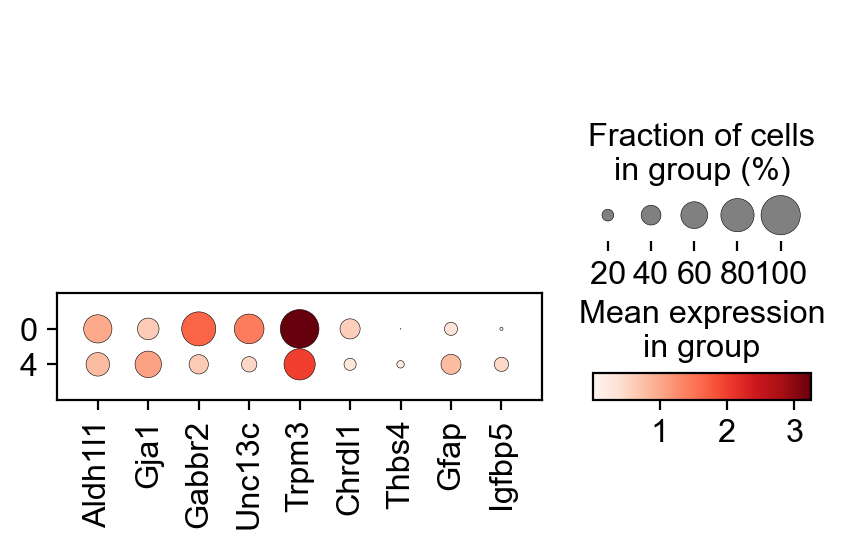

In [399]:
sc.pl.dotplot(P28_astro_dl, astro_markers, groupby='leiden')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


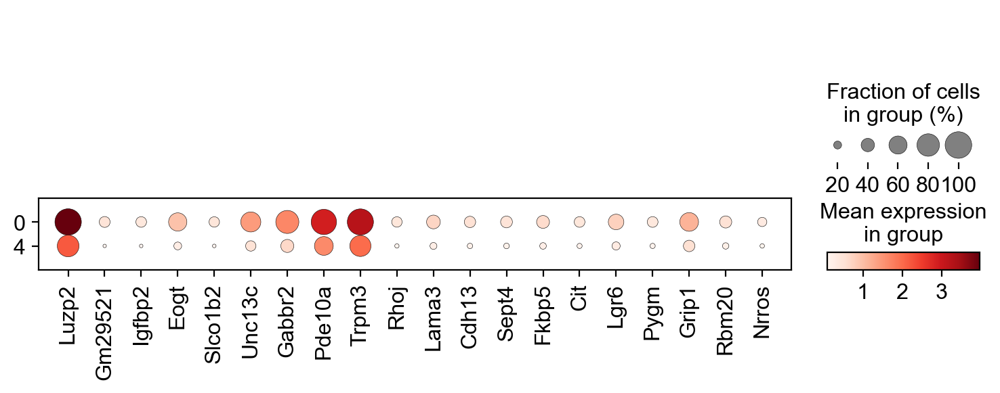

['Luzp2', 'Gm29521', 'Igfbp2', 'Eogt', 'Slco1b2', 'Unc13c']
ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


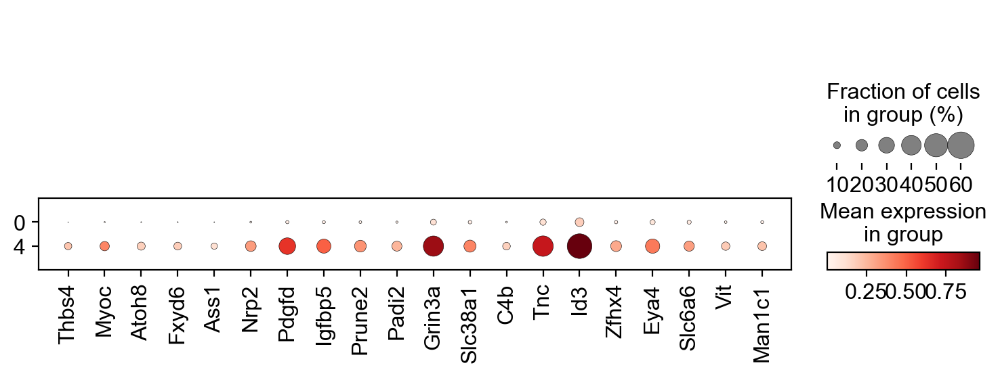

['Thbs4', 'Myoc', 'Atoh8', 'Fxyd6', 'Ass1', 'Nrp2']


In [401]:
for i in ['0', '4']:
    leiden = i
    sc.tl.rank_genes_groups(P28_astro_dl, groupby='leiden', groups=[leiden], reference='rest', method='wilcoxon', n_genes=250)
    #wilcGenes23vRest = list(P28_astro_dl.uns['rank_genes_groups']['names'].astype([(leiden, '<U50')]).view('<U50'))  #list of genes ordered by wilc score
    #if ('Malat1' in wilcGenes23vRest): del wilcGenes23vRest[wilcGenes23vRest.index('Malat1')]

    wilcLF8v14 = P28_astro_dl.uns['rank_genes_groups']['logfoldchanges'].astype([(leiden, '<f8')]).view('<f8') #log fold changes ordered by score

    wilcGenes8v14_s = list(P28_astro_dl.uns['rank_genes_groups']['names'].astype([(leiden, '<U50')]).view('<U50'))  #list of genes ordered by wilc score
    wilcLF8v14_s = P28_astro_dl.uns['rank_genes_groups']['logfoldchanges'].astype([(leiden, '<f8')]).view('<f8') #numpy array of logfoldchnages to be ordered lowest to highest
    wilcLF8v14_s.sort() #log fold changes from lowest to highest
    wilcGenes8v14 = [] #list of genes ordered by logfold change: low to high
    for i in wilcLF8v14_s:
        gene_idx = np.where(wilcLF8v14 == i)[0][0]
        wilcGenes8v14.append(wilcGenes8v14_s[gene_idx])
    wilcGenes8v14_correct = []
    for i in reversed(wilcGenes8v14):
        wilcGenes8v14_correct.append(i) # #list of genes ordered by logfold change high to low

    sc.pl.dotplot(P28_astro_dl, wilcGenes8v14_correct[0:20], groupby='leiden')
    print(wilcGenes8v14_correct[0:6])

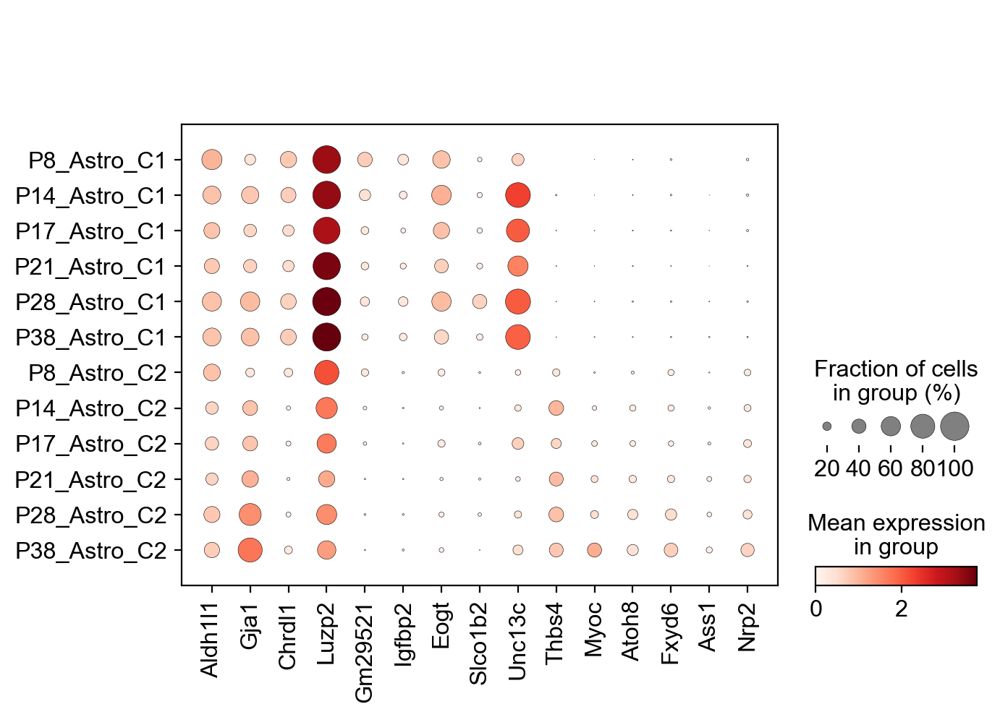

In [404]:
astro_MOIRKERS = ['Aldh1l1', 'Gja1', 'Chrdl1',
                'Luzp2', 'Gm29521', 'Igfbp2', 'Eogt', 'Slco1b2', 'Unc13c',
                'Thbs4', 'Myoc', 'Atoh8', 'Fxyd6', 'Ass1', 'Nrp2']
sc.pl.dotplot(astro_concat, astro_MOIRKERS, groupby='Age_Astro_Num', categories_order=['P8_Astro_C1',  'P14_Astro_C1', 'P17_Astro_C1', 
                                   'P21_Astro_C1', 'P28_Astro_C1', 'P38_Astro_C1', 
                                   'P8_Astro_C2', 'P14_Astro_C2', 'P17_Astro_C2', 
                                   'P21_Astro_C2', 'P28_Astro_C2', 'P38_Astro_C2'],)

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


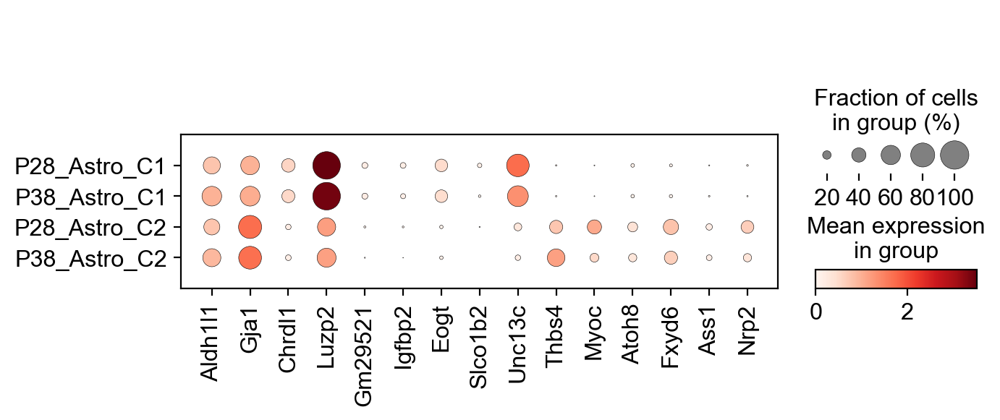

In [406]:
astro_MOIRKERS = ['Aldh1l1', 'Gja1', 'Chrdl1',
                'Luzp2', 'Gm29521', 'Igfbp2', 'Eogt', 'Slco1b2', 'Unc13c',
                'Thbs4', 'Myoc', 'Atoh8', 'Fxyd6', 'Ass1', 'Nrp2']
sc.pl.dotplot(astro_dr_concat, astro_MOIRKERS, groupby='Age_Astro_Num', 
              categories_order=['P28_Astro_C1', 'P38_Astro_C1', 
                                'P28_Astro_C2', 'P38_Astro_C2'])

In [408]:
P28_astro_dl_clust = []
for i in range(P28_astro_dl.shape[0]):
    if ( int(P28_astro_dl.obs.leiden[i]) in (0, 4343) ): P28_astro_dl_clust.append('Astro_C1')
    elif ( int(P28_astro_dl.obs.leiden[i]) in (4, 4242) ): P28_astro_dl_clust.append('Astro_C2')

P28_astro_dl.obs['Astro_Num'] = P28_astro_dl.obs['leiden']
P28_astro_dl.obs['Astro_Num'] = pd.Series(P28_astro_dl_clust, dtype='category').values

In [413]:
astro_drdl_objs = [P28_astro_dr, P38_astro_dr, P28_astro_dl]

ages = ['P28_dr', 'P38_dr', 'P28_dl']
idx = 0
for curr_astro_obj in astro_drdl_objs:
    astro_clust_age = []
    for i in range(curr_astro_obj.shape[0]):
        astro_clust_age.append(ages[idx] + '_' + curr_astro_obj.obs.Astro_Num[i])
    curr_astro_obj.obs['Age_Astro_Num'] = curr_astro_obj.obs['Astro_Num']
    curr_astro_obj.obs['Age_Astro_Num'] = pd.Series(astro_clust_age, dtype='category').values
    idx = idx + 1

astro_drdl_concat = P28_astro_dr.concatenate(P38_astro_dr, P28_astro_dl, 
                                           batch_categories=['P28_dr', 'P38_dr', 'P28_dl'])

In [422]:
astro_drdl_concat.obs.Age_Astro_Num.values.categories

Index(['P28_dl_Astro_C1', 'P28_dl_Astro_C2', 'P28_dr_Astro_C1',
       'P28_dr_Astro_C2', 'P38_dr_Astro_C1', 'P38_dr_Astro_C2'],
      dtype='object')

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


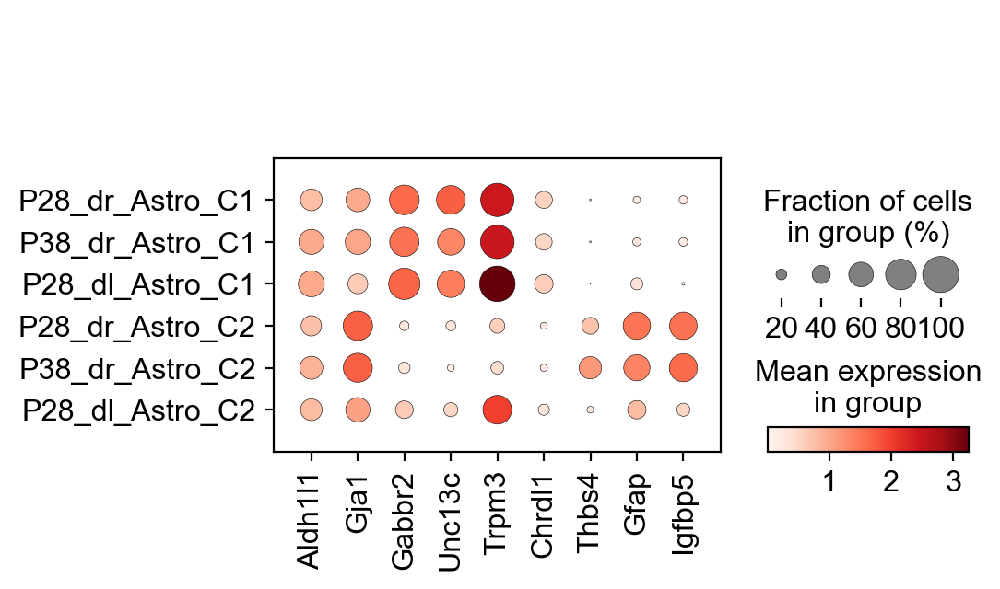

In [423]:
astro_markers = ['Aldh1l1', 'Gja1',
                 'Gabbr2', 'Unc13c', 'Trpm3', 'Chrdl1',
                'Thbs4', 'Gfap', 'Igfbp5']
sc.pl.dotplot(astro_drdl_concat, astro_markers, groupby='Age_Astro_Num', 
              categories_order=['P28_dr_Astro_C1', 'P38_dr_Astro_C1', 'P28_dl_Astro_C1',
                                'P28_dr_Astro_C2', 'P38_dr_Astro_C2', 'P28_dl_Astro_C2'], save='astro_drdl_num.pdf')